# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000"> CatBoost MasterClass</p>

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 10px 10px;">
    <b>  </b>
Hello Kagglers, <br><br>
As we embark on our machine learning journey, we often encounter the challenge of working with categorical data. In the sklearn library, it is necessary to convert these categorical variables into a numerical format. To accomplish this, we employ various preprocessing techniques such as "label encoding," "one-hot encoding," and others. <br><br>
In this kernel, we will delve into a powerful open-source library called CatBoost, which has been developed and contributed by Yandex. CatBoost stands out because it allows us to directly utilize categorical features in our machine learning models. This feature not only saves us the hassle of converting categorical data into numerical form but also enables us to capture the inherent information within these categorical variables effectively. Furthermore, CatBoost is known for its scalability, making it suitable for handling large datasets with high-dimensional categorical features.<br><br>
So, let's dive in and explore the remarkable capabilities of CatBoost!
</p> 

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 10px 10px;">
    <b> Evaluation Metric (=AUC): </b>
<br>
In this Kaggle challenge, the submissions are evaluated on Area Under the ROC curve between the predicted probability and the observed target.
</p> 

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">Import Libraries</p>

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing
from pandas.api.types import is_numeric_dtype
import seaborn as sns
import matplotlib.pyplot as plt

import optuna
from optuna.samplers import TPESampler

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE


# Models
from catboost import CatBoostClassifier, Pool
from catboost.utils import eval_metric


# Ignore warnings ;)
import warnings
warnings.simplefilter("ignore")

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">Import the data</p> 

In [2]:
# files path
train_path     = "/kaggle/input/playground-series-s3e17/train.csv"
test_path      = "/kaggle/input/playground-series-s3e17/test.csv"
original_path  = "/kaggle/input/machine-failure-predictions/machine failure.csv"

# function to import our dataset 
def import_data(train_path, test_path, original_path):     
    train      =  pd.read_csv(train_path)
    test       =  pd.read_csv(test_path)
    original   =  pd.read_csv(original_path)
    
    return train, test, original

train, test, original = import_data(train_path, test_path, original_path)

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Dataset Details:<b> 
</p> 

According to the documentation of the AI4I 2020 Predictive Maintenance Dataset:

**Type:** consisting of a letter L, M, or H for Low, Medium and High as product quality variants. <br>
**Air temperature [K]:** generated using a random walk process later normalized to a standard deviation of 2 K around 300 K. <br>
**Process temperature [K]:** generated using a random walk process normalized to a standard deviation of 1 K, added to the air temperature plus 10 K. <br>
**Rotational speed [rpm]:** calculated from a power of 2860 W, overlaid with a normally distributed noise. <br>
**Torque [Nm]:** torque values are normally distributed around 40 Nm with a Ïƒ = 10 Nm and no negative values. <br>
**Tool wear [min]:** The quality variants H/M/L add 5/3/2 minutes of tool wear to the used tool in the process. <br>
**Machine failure:** whether the machine has failed in this particular datapoint for any of the following failure modes are true. <br>


**The machine failure consists of five independent failure modes:**

**Tool wear failure (TWF):** the tool will be replaced of fail at a randomly selected tool wear time between 200 ~ 240 mins. <br>
**Heat dissipation failure (HDF):** heat dissipation causes a process failure, if the difference between air and process temperature is below 8.6 K and the rotational speed is below 1380 rpm. <br>
**Power failure (PWF):** the product of torque and rotational speed (in rad/s) equals the power required for the process. If this power is below 3500 W or above 9000 W, the process fails. <br>
**Overstrain failure (OSF):** if the product of tool wear and torque exceeds 11,000 minNm for the L product variant (12,000 M, 13,000 H), the process fails due to overstrain.
random failures (RNF): each process has a chance of 0,1 % to fail regardless of its process parameters. <br>
        
If at least one of the above failure modes is true, the process fails and the 'machine failure' label is set to 1.

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">Exploratory Data Analysis - EDA</p> 

In [3]:
train.head(3)

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0


In [4]:
original.head(3)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0


In [5]:
test.head(3)

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0


Now, we'll try to use some descriptive statistics

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">1. Univariate Stats</p> 

With the .describe() method from pandas we can see basic stats like **count, mean, standard deviation, minimum, maximum, quantiles...**

In [6]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,136429.0,68214.000000,39383.804275,0.0,34107.0,68214.0,102321.0,136428.0
Air temperature [K],136429.0,299.862776,1.862247,295.3,298.3,300.0,301.2,304.4
Process temperature [K],136429.0,309.941070,1.385173,305.8,308.7,310.0,310.9,313.8
Rotational speed [rpm],136429.0,1520.331110,138.736632,1181.0,1432.0,1493.0,1580.0,2886.0
Torque [Nm],136429.0,40.348643,8.502229,3.8,34.6,40.4,46.1,76.6
Tool wear [min],136429.0,104.408901,63.965040,0.0,48.0,106.0,159.0,253.0
Machine failure,136429.0,0.015744,0.124486,0.0,0.0,0.0,0.0,1.0
TWF,136429.0,0.001554,0.039389,0.0,0.0,0.0,0.0,1.0
HDF,136429.0,0.005160,0.071649,0.0,0.0,0.0,0.0,1.0
PWF,136429.0,0.002397,0.048899,0.0,0.0,0.0,0.0,1.0


In [7]:
original.describe().T

,count,mean,std,min,25%,50%,75%,max
UDI,10000.0,5000.50000,2886.895680,1.0,2500.75,5000.5,7500.25,10000.0
Air temperature [K],10000.0,300.00493,2.000259,295.3,298.30,300.1,301.50,304.5
Process temperature [K],10000.0,310.00556,1.483734,305.7,308.80,310.1,311.10,313.8
Rotational speed [rpm],10000.0,1538.77610,179.284096,1168.0,1423.00,1503.0,1612.00,2886.0
Torque [Nm],10000.0,39.98691,9.968934,3.8,33.20,40.1,46.80,76.6
Tool wear [min],10000.0,107.95100,63.654147,0.0,53.00,108.0,162.00,253.0
Machine failure,10000.0,0.03390,0.180981,0.0,0.00,0.0,0.00,1.0
TWF,10000.0,0.00460,0.067671,0.0,0.00,0.0,0.00,1.0
HDF,10000.0,0.01150,0.106625,0.0,0.00,0.0,0.00,1.0
PWF,10000.0,0.00950,0.097009,0.0,0.00,0.0,0.00,1.0


In [8]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
id,90954.0,181905.500000,26256.302529,136429.0,159167.25,181905.5,204643.75,227382.0
Air temperature [K],90954.0,299.859493,1.857562,295.3,298.30,300.0,301.20,304.4
Process temperature [K],90954.0,309.939375,1.385296,305.7,308.70,310.0,310.90,313.8
Rotational speed [rpm],90954.0,1520.528179,139.970419,1168.0,1432.00,1493.0,1579.00,2886.0
Torque [Nm],90954.0,40.335191,8.504683,3.8,34.60,40.5,46.20,76.6
Tool wear [min],90954.0,104.293962,63.871092,0.0,48.00,106.0,158.00,253.0
TWF,90954.0,0.001473,0.038355,0.0,0.00,0.0,0.00,1.0
HDF,90954.0,0.005343,0.072903,0.0,0.00,0.0,0.00,1.0
PWF,90954.0,0.002353,0.048449,0.0,0.00,0.0,0.00,1.0
OSF,90954.0,0.003870,0.062090,0.0,0.00,0.0,0.00,1.0


<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 
From the count column we can see that there is no missing values in our train dataset. <br>
Let's be sure about this assumption for the test and the original datasets. <br>
To achieve this, we will define our own function for univariate statistics with more informations such as the mode, skewness and kurtosis...
</b>
</p> 

In [9]:
# List of numerical columns and categorical columns

numeric_cols = ['Air temperature [K]',
                'Process temperature [K]',
                'Rotational speed [rpm]',
                'Torque [Nm]',
                'Tool wear [min]']
binary_cols = [  
                'TWF',
                'HDF',
                'PWF',
                'OSF',
                'RNF']

categ_cols   = train.select_dtypes(include=['object']).columns.tolist()
target       = 'Machine failure'
numeric_cols
#categ_cols

['Air temperature [K]',
 'Process temperature [K]',
 'Rotational speed [rpm]',
 'Torque [Nm]',
 'Tool wear [min]']

In [10]:
# fonction to calculate univariate stats like pandas describe method
def univariate_stats(df):
    #df.drop('id', axis=1, inplace=True)
    output_df = pd.DataFrame(columns=['Count', 'Missing', 'Unique', 'Dtype', 'IsNumeric', 'Mode', 'Mean', 'Min', '25%', 'Median', '75%', 'Max', 'Std', 'Skew', 'Kurt'])
    
    for col in df[numeric_cols + categ_cols]:
        if is_numeric_dtype(df[col]):
            output_df.loc[col] = [df[col].count(), df[col].isnull().sum(), df[col].nunique(), df[col].dtype, is_numeric_dtype(df[col]), df[col].mode().values[0], df[col].mean(), df[col].min(), df[col].quantile(.25), df[col].median(), df[col].quantile(.75), df[col].max(), df[col].std(), df[col].skew(), df[col].kurt() ]
        else:
            output_df.loc[col] = [df[col].count(), df[col].isnull().sum(), df[col].nunique(), df[col].dtype, is_numeric_dtype(df[col]), df[col].mode().values[0], '-', '-', '-', '-', '-', '-', '-', '-', '-' ]

    return output_df.sort_values(by=['IsNumeric', 'Unique'], ascending=False)


pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

In [11]:
# Call the function on train
univariate_stats(train)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],136429,0,952,int64,True,1452.0,1520.33111,1181.0,1432.0,1493.0,1580.0,2886.0,138.736632,1.88825,8.183452
Torque [Nm],136429,0,611,float64,True,37.7,40.348643,3.8,34.6,40.4,46.1,76.6,8.502229,-0.028963,0.130166
Tool wear [min],136429,0,246,int64,True,0.0,104.408901,0.0,48.0,106.0,159.0,253.0,63.96504,-0.02731,-1.195126
Air temperature [K],136429,0,95,float64,True,300.7,299.862776,295.3,298.3,300.0,301.2,304.4,1.862247,0.161175,-0.781569
Process temperature [K],136429,0,81,float64,True,310.6,309.94107,305.8,308.7,310.0,310.9,313.8,1.385173,0.057088,-0.598883
Product ID,136429,0,9976,object,False,L53257,-,-,-,-,-,-,-,-,-
Type,136429,0,3,object,False,L,-,-,-,-,-,-,-,-,-


In [12]:
# Call the function to check univariate stats on the original dataset
univariate_stats(original)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],10000,0,941,int64,True,1452.0,1538.7761,1168.0,1423.0,1503.0,1612.0,2886.0,179.284096,1.993171,7.392945
Torque [Nm],10000,0,577,float64,True,40.2,39.98691,3.8,33.2,40.1,46.8,76.6,9.968934,-0.009517,-0.013241
Tool wear [min],10000,0,246,int64,True,0.0,107.951,0.0,53.0,108.0,162.0,253.0,63.654147,0.027292,-1.166737
Air temperature [K],10000,0,93,float64,True,300.7,300.00493,295.3,298.3,300.1,301.5,304.5,2.000259,0.114274,-0.835962
Process temperature [K],10000,0,82,float64,True,310.6,310.00556,305.7,308.8,310.1,311.1,313.8,1.483734,0.015027,-0.499734
Product ID,10000,0,10000,object,False,H29424,-,-,-,-,-,-,-,-,-
Type,10000,0,3,object,False,L,-,-,-,-,-,-,-,-,-


In [13]:
# Call the function to check univariate stats on test dataset
univariate_stats(test)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],90954,0,946,int64,True,1452.0,1520.528179,1168.0,1432.0,1493.0,1579.0,2886.0,139.970419,1.947502,8.55058
Torque [Nm],90954,0,595,float64,True,37.7,40.335191,3.8,34.6,40.5,46.2,76.6,8.504683,-0.051562,0.124109
Tool wear [min],90954,0,246,int64,True,0.0,104.293962,0.0,48.0,106.0,158.0,253.0,63.871092,-0.019823,-1.191195
Air temperature [K],90954,0,92,float64,True,300.7,299.859493,295.3,298.3,300.0,301.2,304.4,1.857562,0.163401,-0.771786
Process temperature [K],90954,0,84,float64,True,310.6,309.939375,305.7,308.7,310.0,310.9,313.8,1.385296,0.049152,-0.597981
Product ID,90954,0,9909,object,False,L56257,-,-,-,-,-,-,-,-,-
Type,90954,0,3,object,False,L,-,-,-,-,-,-,-,-,-


<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡The 'Product ID' column: <br>
        <ul>
        <li>It's a categorical column which has only 9976 values out of a total of 136429 in the train dataset. We can notice the same fact in the test dataset (9909 out of 90954 values) </li>
        <li> Conversely in the original there are as many Product ID as there are values </li> <br>  
        </ul>
So I think it may be a very important columns determining the Machine Failure.       
</b>
</p> 

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 
Let's visualize some graphics to gain more insights. <br>
</b>
</p> 

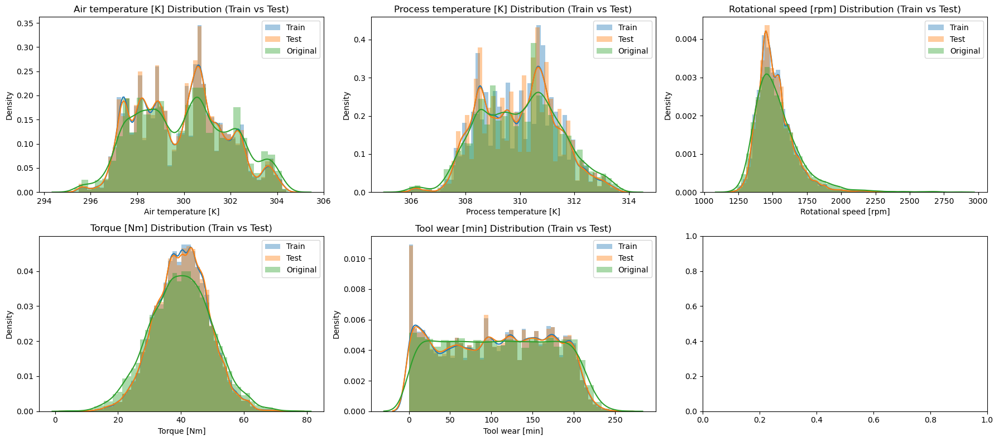

In [14]:
def plot_histograms(df_train, df_test, original, target, n_cols=3):
    n_rows = (len(df_train.columns) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))
    axes = axes.flatten()

    for i, var_name in enumerate(df_train.columns.tolist()):
        ax = axes[i]
        sns.distplot(df_train[var_name], kde=True, ax=ax, label='Train')
        if var_name != target:
            sns.distplot(df_test[var_name], kde=True, ax=ax, label='Test')
        sns.distplot(original[var_name], kde=True, ax=ax, label='Original')
        ax.set_title(f'{var_name} Distribution (Train vs Test)')
        ax.legend()

    plt.tight_layout()
    plt.show()
        
plot_histograms(train[numeric_cols], test[numeric_cols], original[numeric_cols], target, n_cols=3)

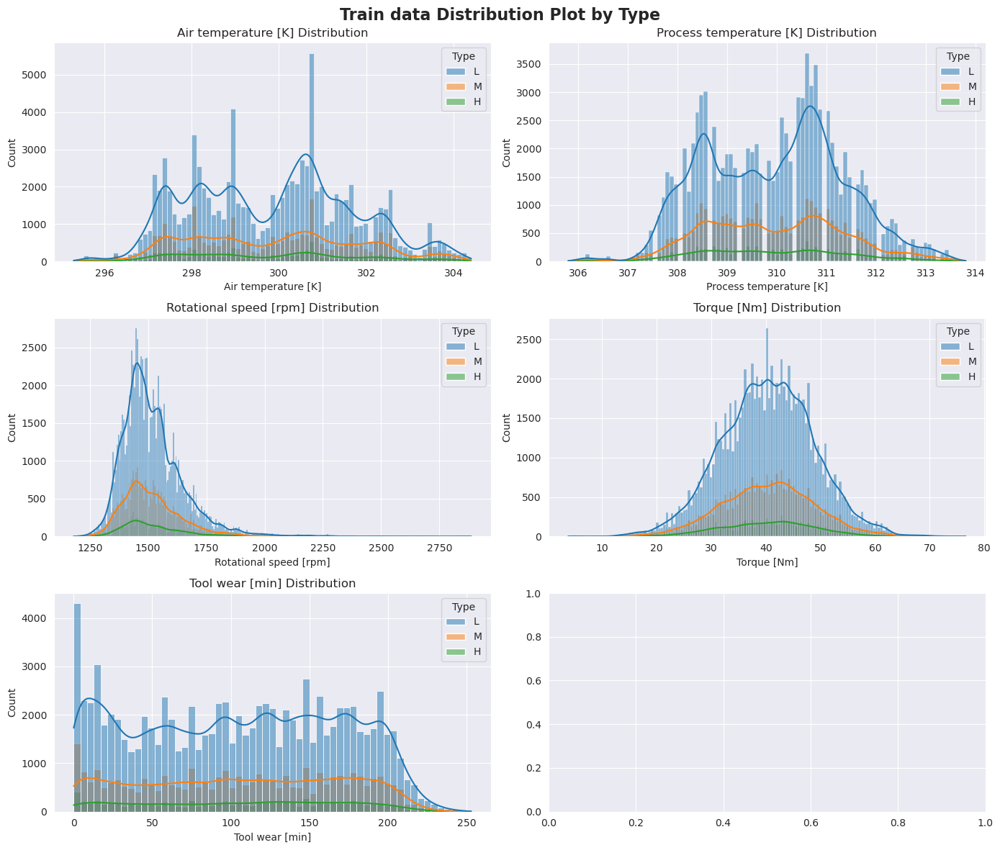

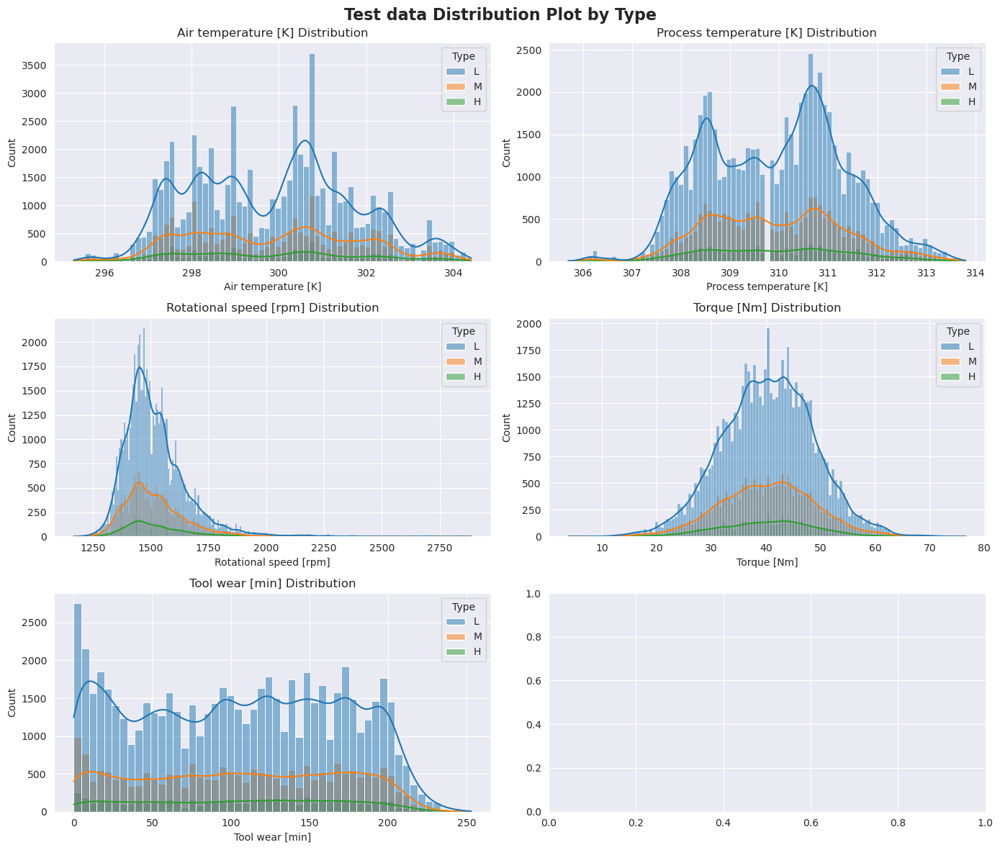

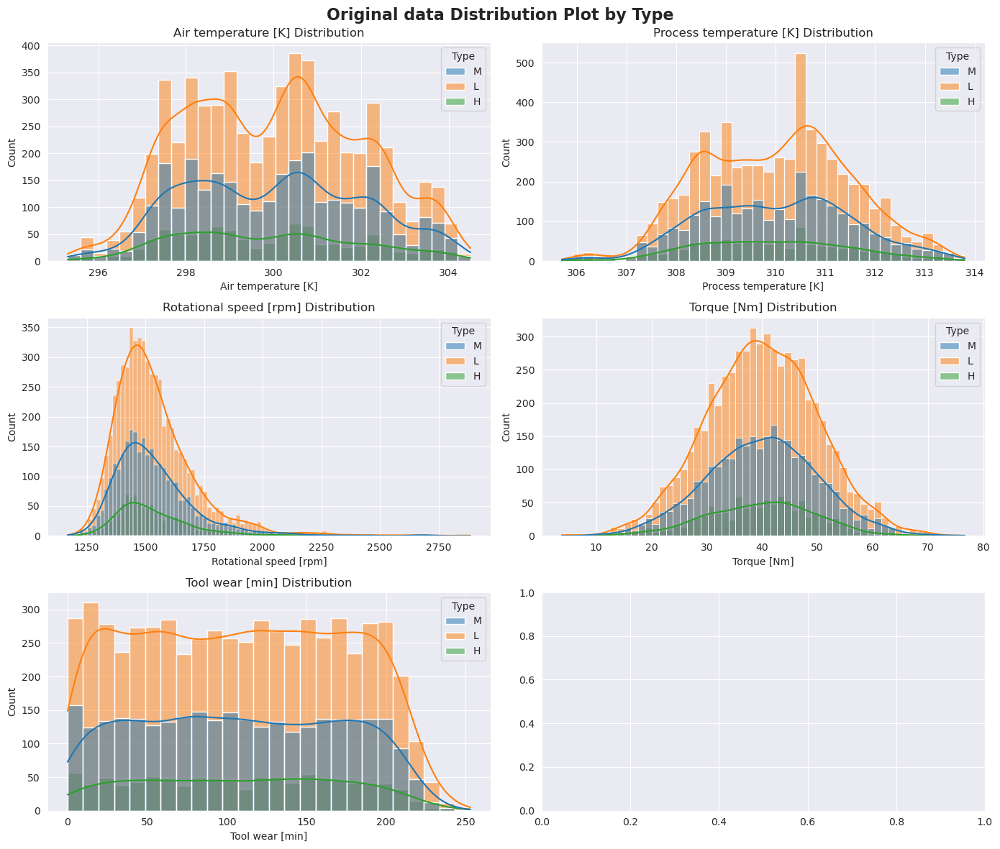

In [15]:
def plot_distribution(df, hue, title='', drop_cols=[]):
    sns.set_style('darkgrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_cols = 2
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.histplot(data=df, x=var_name, kde=True, ax=ax, hue=hue) # sns.distplot(df_train[var_name], kde=True, ax=ax, label='Train')
        ax.set_title(f'{var_name} Distribution')

    fig.suptitle(f'{title} Distribution Plot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()
    
plot_distribution(train[numeric_cols+['Type']], hue='Type', title='Train data')
plot_distribution(test[numeric_cols+['Type']], hue='Type', title='Test data')
plot_distribution(original[numeric_cols+['Type']], hue='Type', title='Original data')

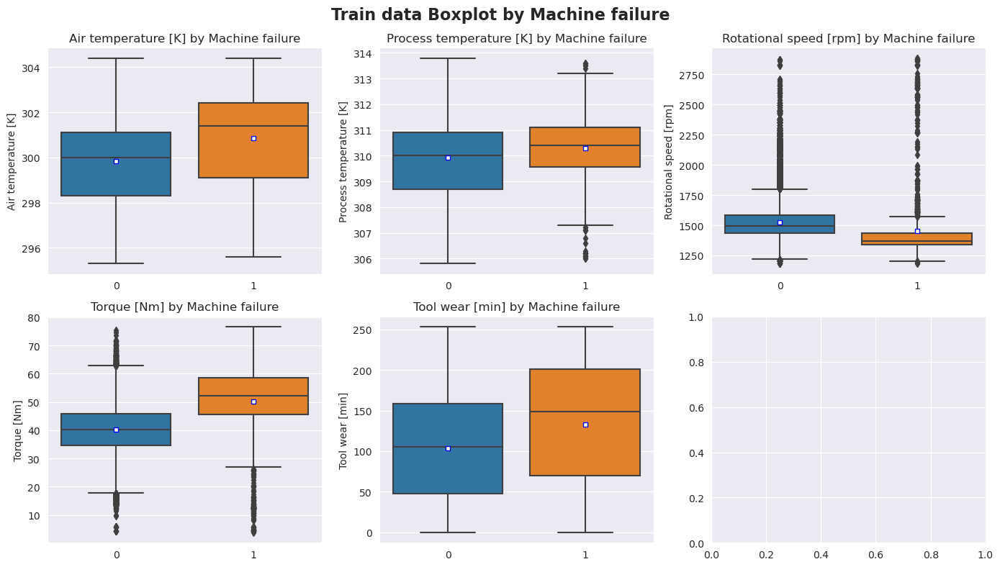

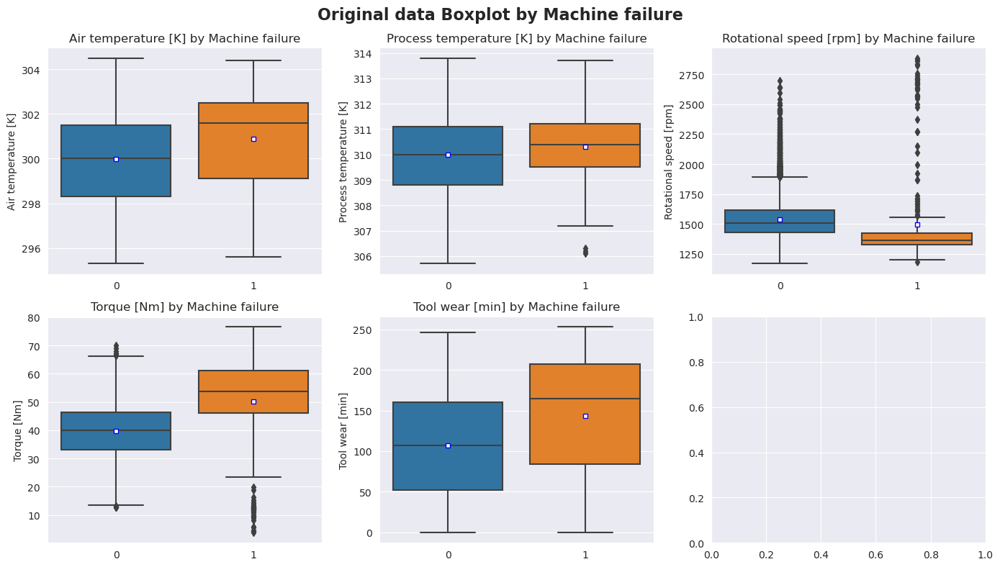

In [16]:
def plot_boxplot(df, hue, title='', drop_cols=[], n_cols=3):
    sns.set_style('darkgrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.boxplot(data=df, x=hue, y=var_name, ax=ax, showmeans=True, 
                    meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue", "markersize":"5"})
        ax.set_title(f'{var_name} by {hue}')
        ax.set_xlabel('')

    fig.suptitle(f'{title} Boxplot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()
    
plot_boxplot(train[numeric_cols+[target]], hue=target, n_cols=3, title='Train data')
plot_boxplot(original[numeric_cols+[target]], hue=target, n_cols=3, title='Original data')

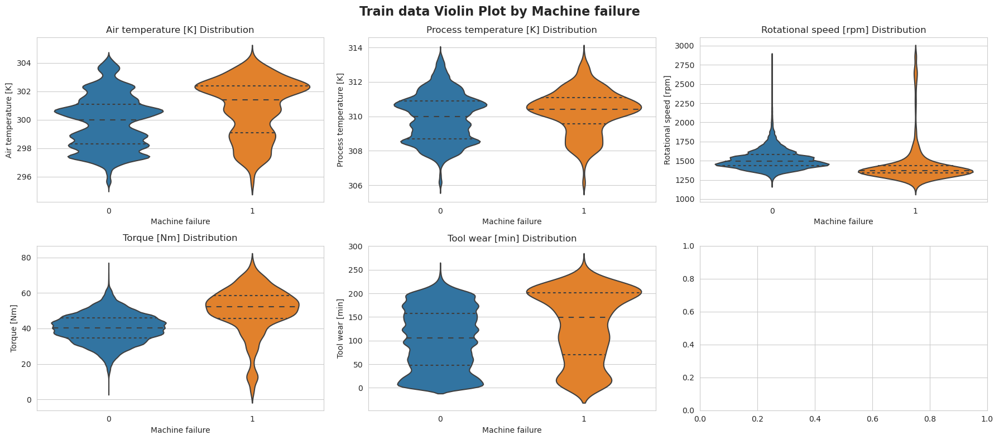

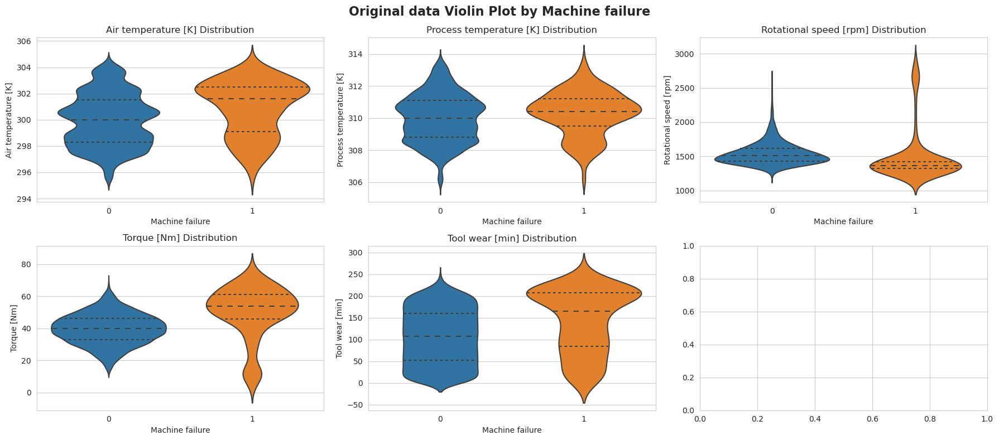

In [17]:
def plot_violinplot(df, hue, drop_cols=[], n_cols=2, title=''):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.violinplot(data=df, x=hue, y=var_name, ax=ax, inner='quartile')
        ax.set_title(f'{var_name} Distribution')

    fig.suptitle(f'{title} Violin Plot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()
    
plot_violinplot(train[numeric_cols+[target]], hue=target, n_cols=3, title='Train data')
plot_violinplot(original[numeric_cols+[target]], hue=target, n_cols=3, title='Original data')

Function inspired from [this notebook](https://www.kaggle.com/code/magantiit/machine-failures-s3-ep17-catboost-0-97832) by @MAGANTI IT

In [18]:
#function to visualize the binary machine failures
def plot_binary_machine_failures(dataframe, column):
    # Plot the machine failures
    plt.figure(figsize=(10, 6))

    # Countplot for Machine failure
    ax = plt.subplot(1, 2, 1)
    ax = sns.countplot(x=column, data=dataframe)
    ax.bar_label(ax.containers[0])
    plt.title(column + " Failure", fontsize=20)

    # Pie chart for Outcome
    ax = plt.subplot(1, 2, 2)
    outcome_counts = dataframe[column].value_counts()
    ax = outcome_counts.plot.pie(explode=[0.1, 0.1], autopct='%1.2f%%', shadow=True)
    ax.set_title("Outcome", fontsize=20, color='Red', font='Lucida Calligraphy')

    # Display the plot
    plt.tight_layout()
    plt.show()

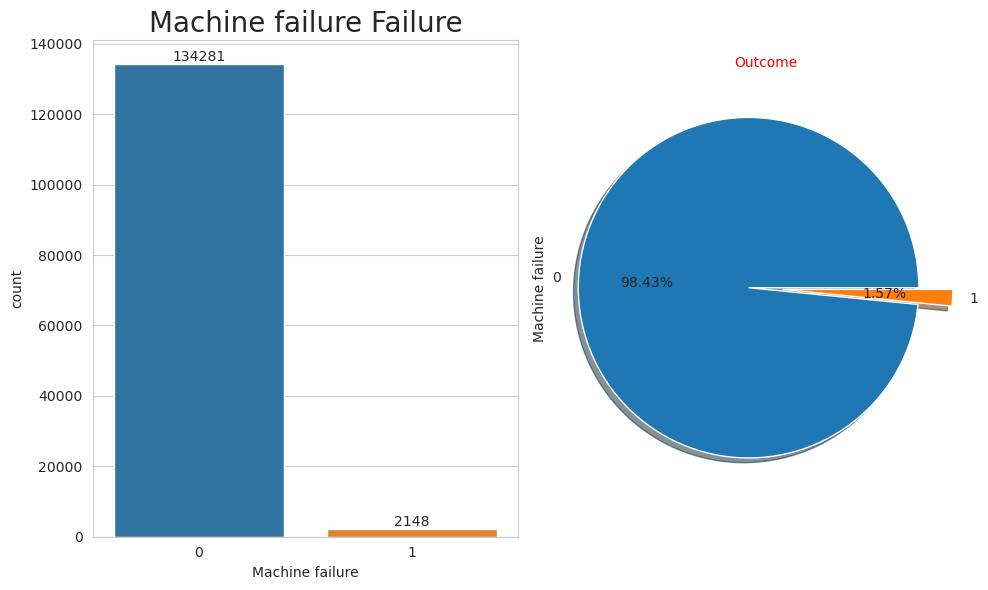

In [19]:
# Visualize the machine failure
plot_binary_machine_failures(train, 'Machine failure')

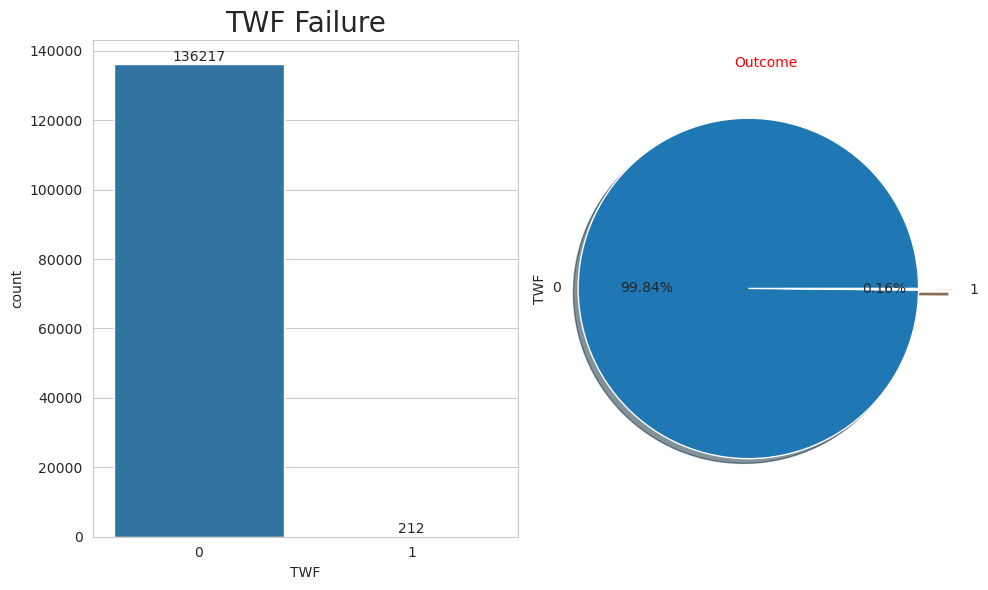

In [20]:
plot_binary_machine_failures(train, 'TWF')

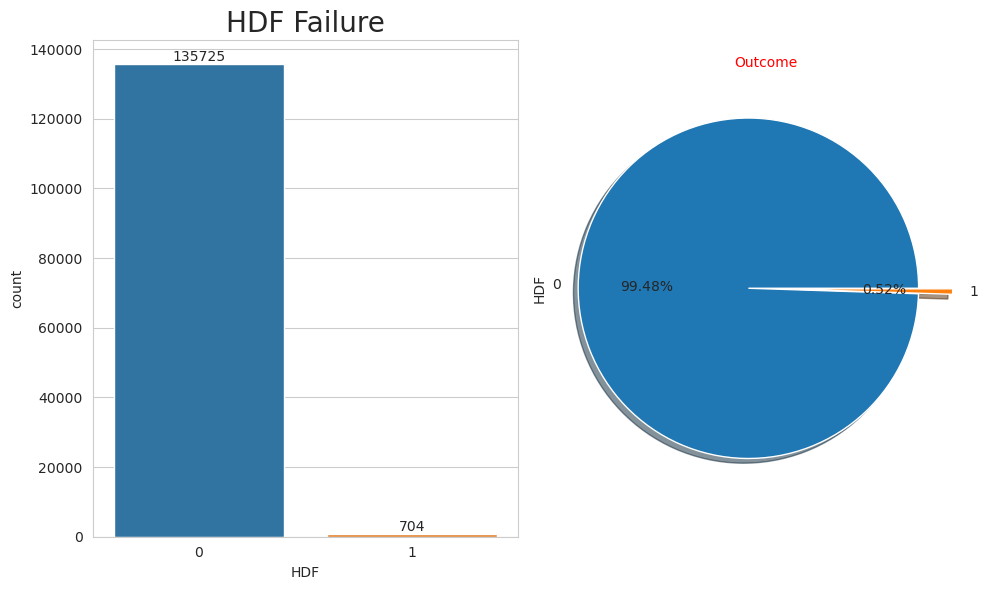

In [21]:
plot_binary_machine_failures(train, 'HDF')

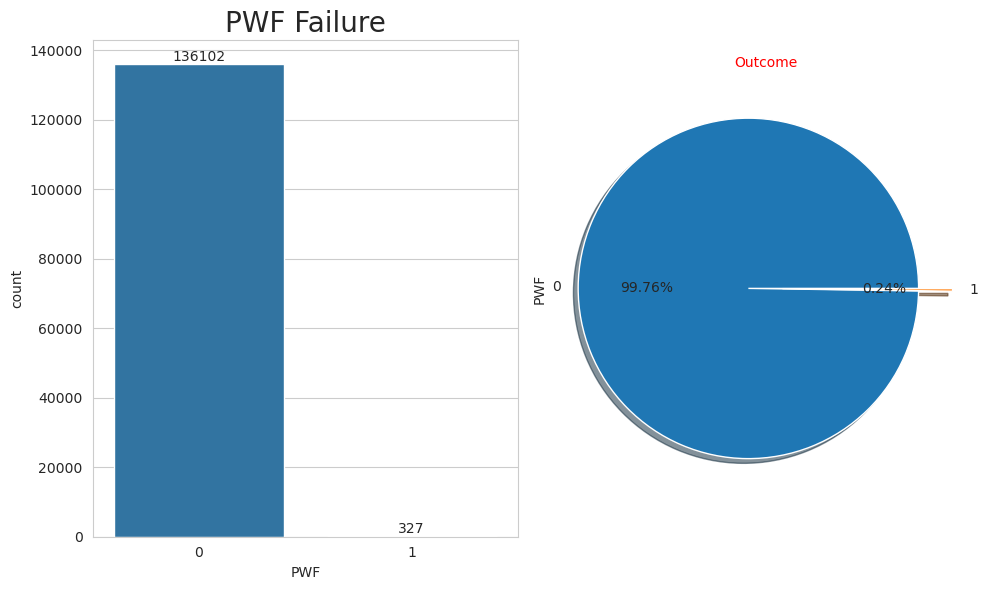

In [22]:
plot_binary_machine_failures(train, 'PWF')

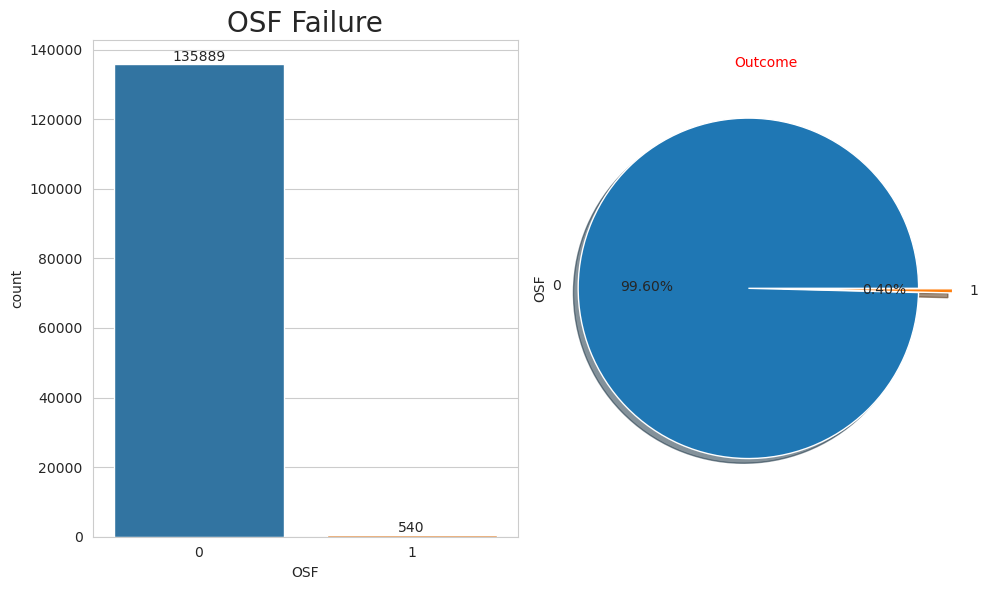

In [23]:
plot_binary_machine_failures(train, 'OSF')

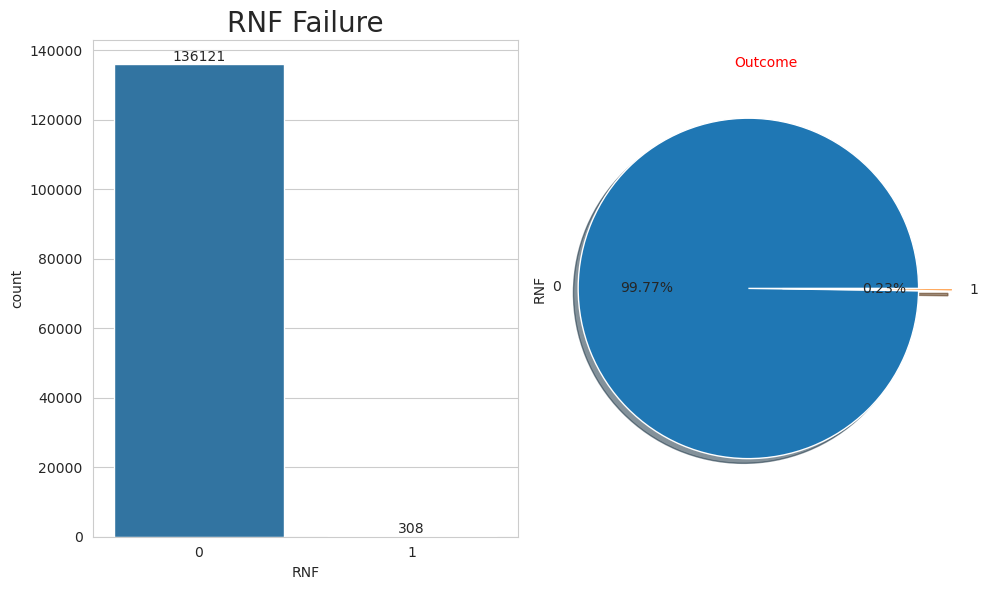

In [24]:
plot_binary_machine_failures(train, 'RNF')

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Additional Insights:<br><br>
1. From the above analysis, it can be seen that the dataset is highly imbalanced <br>
2. Some columns in the dataset are normally distributed("Rotational speed [rpm]", "Torque[Nm]")
</b>
</p> 

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">2. Bivariate Statistics</p> 

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Recall: There are three types of bivariate analysis.</b><br>       
<ul> 
<li> <b>Numerical - Numerical: Pearson's Correlation</b> </li> <br>
The correlation represents the strength of a linear relationship between two numerical variables. If there is no correlation between the two variables, there is no tendency to change along with the values of the second quantity.  <br>  <br>
<li> <b>Categorical - Numerical: one-way ANOVA(3 + groups) or t-test (exactly 2 groups)</b>       </li> <br>
The ANOVA test is used to determine whether there is a significant difference among the averages of more than two groups that are statistically different from each other. <br><br>
<li> <b>Categorical - Categorical: Chi-square Test</b>       </li> <br>
It is calculated based on the difference between expected frequencies and the observed frequencies in one or more categories of the frequency table.
</ul>
</p> 

In [25]:
# this just an intermediate function that will be used in bivstats for one-way ANOVA
def anova(df, feature, label):
    import pandas as pd
    import numpy as np
    from scipy import stats
    
    groups = df[feature].unique()
    df_grouped = df.groupby(feature)
    group_labels = []
    for g in groups:
        g_list = df_grouped.get_group(g)
        group_labels.append(g_list[label])
        
    return stats.f_oneway(*group_labels)

# function to calculate bivariate stats; Pearson' correlation, p-value and one-way ANOVA
def bivstats(df, label):
    from scipy import stats
    import pandas as pd
    import numpy as np
    
    # Create an empty DataFrame to store output
    output_df = pd.DataFrame(columns=['Stat', '+1/-1 * ', 'Effect size', 'p-value'])
    
    for col in df:
        if col != label:
            if df[col].isnull().sum() == 0:
                if is_numeric_dtype(df[col]):   # Calculate r and p
                    r, p = stats.pearsonr(df[label], df[col])
                    output_df.loc[col] = ['r', np.sign(r), abs(round(r, 3)), round(p,6)]
                    
                else:
                    F, p = anova(df[[col, label]], col, label)
                    output_df.loc[col] = ['F', '', round(F, 3), round(p,6)]
                    
            else:
                output_df.loc[col] = [np.nan, np.nan, np.nan, np.nan]

    return output_df.sort_values(by=['Effect size', 'Stat'], ascending=[False, False])
 
pd.options.display.float_format = '{:.5f}'.format
bivstats(train, target)

,Stat,+1/-1 *,Effect size,p-value
Type,F,,9.94800,0.00005
Product ID,F,,2.64000,0.00000
HDF,r,1.00000,0.56500,0.00000
OSF,r,1.00000,0.49500,0.00000
PWF,r,1.00000,0.38400,0.00000
TWF,r,1.00000,0.31200,0.00000
Torque [Nm],r,1.00000,0.14600,0.00000
Air temperature [K],r,1.00000,0.06800,0.00000
Rotational speed [rpm],r,-1.00000,0.06100,0.00000
Tool wear [min],r,1.00000,0.05600,0.00000


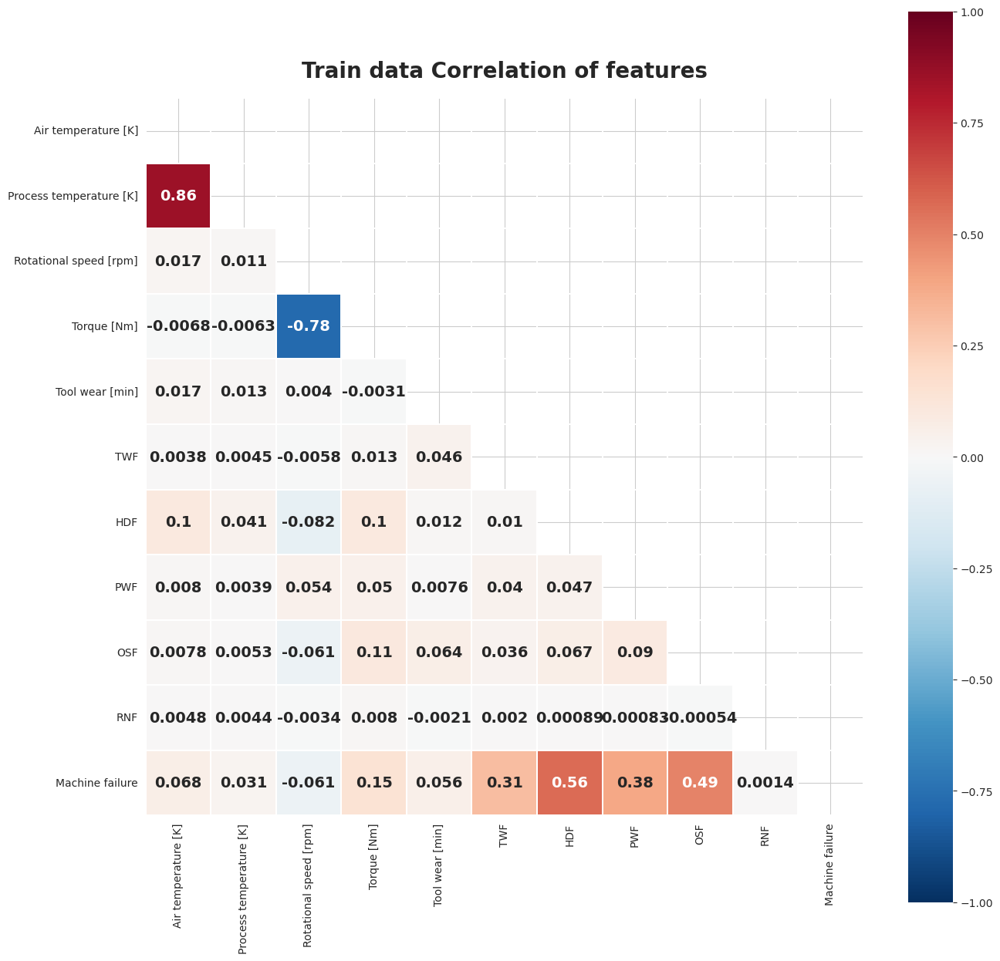

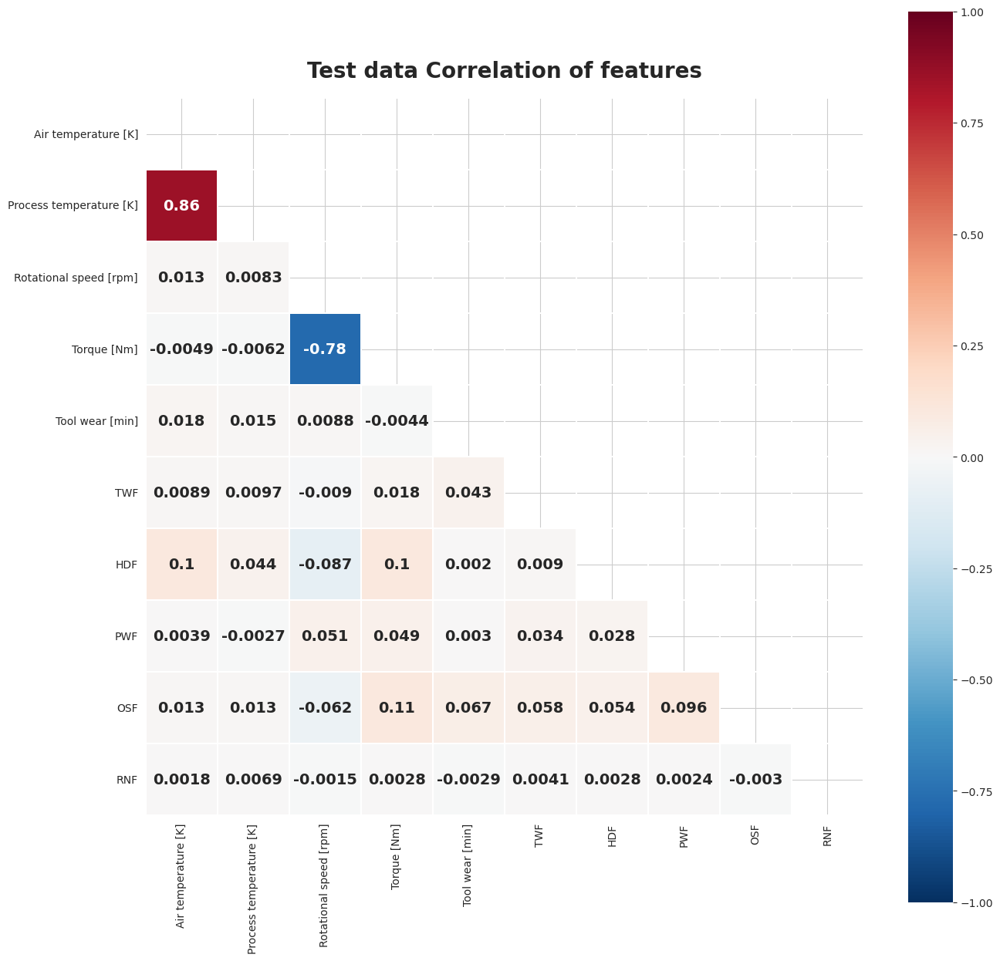

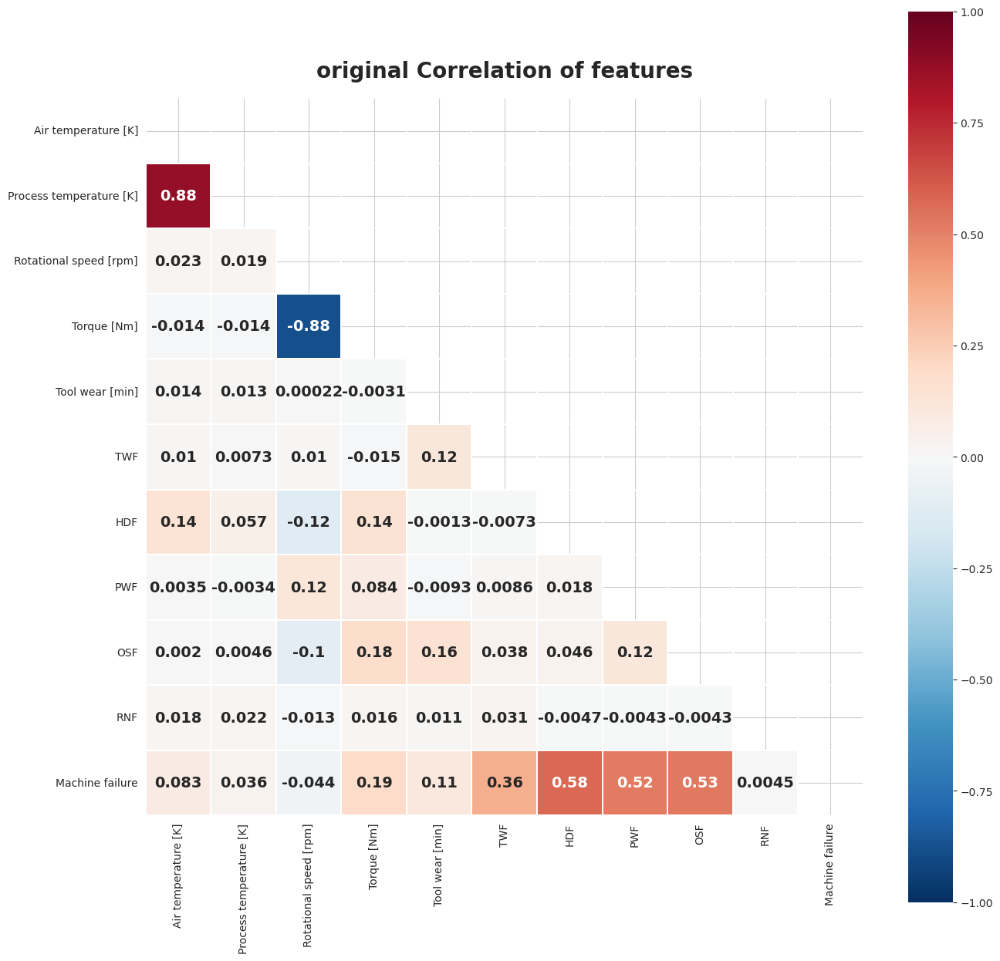

In [26]:
def plot_heatmap(df, title):
    # Create a mask for the diagonal elements
    mask = np.zeros_like(df.astype(float).corr())
    mask[np.triu_indices_from(mask)] = True

    # Set the colormap and figure size
    colormap = plt.cm.RdBu_r
    plt.figure(figsize=(15, 15))

    # Set the title and font properties
    plt.title(f'{title} Correlation of features', fontweight='bold', y=1.02, size=20)

    # Plot the heatmap with the masked diagonal elements
    sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0, 
                square=True, cmap=colormap, linecolor='white', annot=True, annot_kws={"size": 14, "weight": "bold"},
                mask=mask)

plot_heatmap(train[numeric_cols+binary_cols+[target]], title='Train data')
plot_heatmap(test[numeric_cols+binary_cols], title='Test data')
plot_heatmap(original[numeric_cols+binary_cols+[target]], title='original')

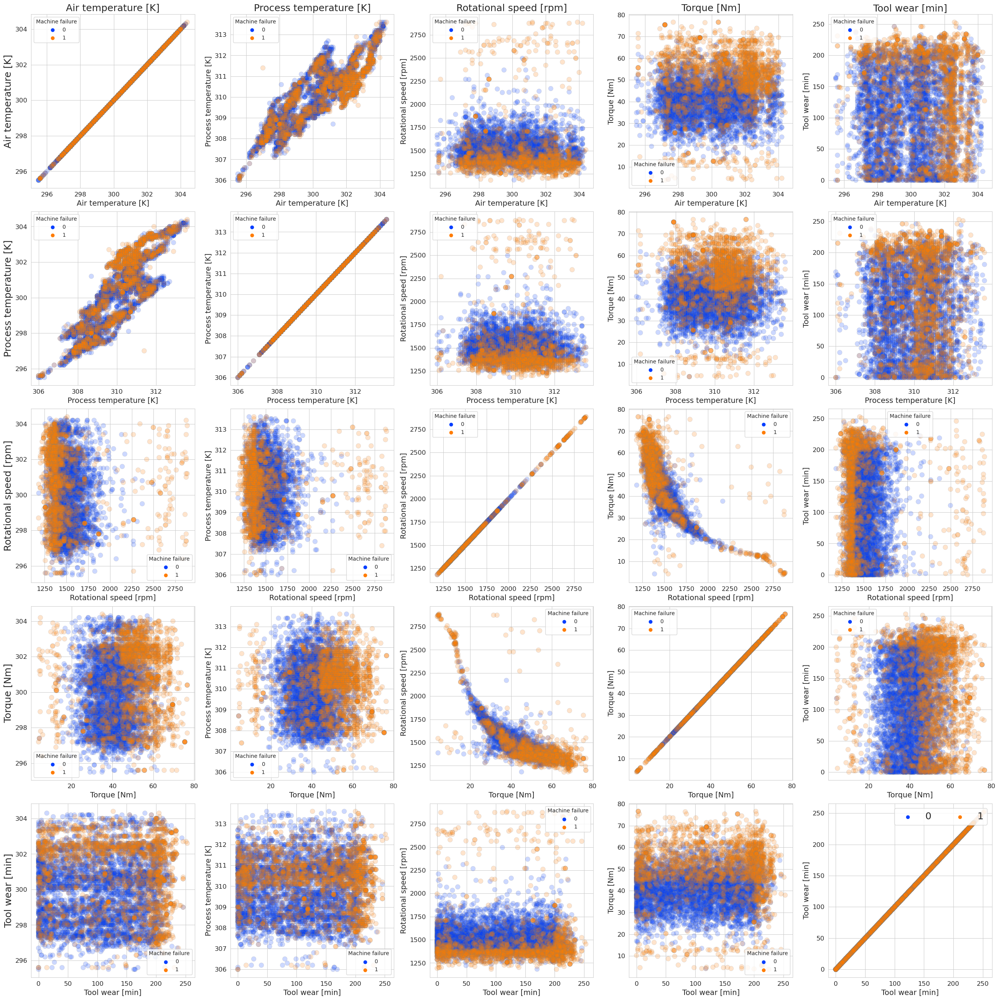

In [27]:
def plot_scatter_matrix(df, target_col, drop_cols=[], size=26):
    # sns.pairplot()
    
    sns.set_style('whitegrid')
    cols = df.columns.drop([target_col] + drop_cols)
    fig, axes = plt.subplots(len(cols), len(cols), figsize=(size, size), sharex=False, sharey=False)

    for i, col in enumerate(cols):
        for j, col_ in enumerate(cols):
            axes[i,j].set_xlabel(f'{col}', fontsize=14)
            axes[i,j].set_ylabel(f'{col_}', fontsize=14)

            # Plot the scatterplot
            sns.scatterplot(data=df, x=col, y=col_, hue=target_col, ax=axes[i,j],
                            s=80, edgecolor='gray', alpha=0.2, palette='bright')

            axes[i,j].tick_params(axis='both', which='major', labelsize=12)

            if i == 0:
                axes[i,j].set_title(f'{col_}', fontsize=18)
            if j == 0:
                axes[i,j].set_ylabel(f'{col}', fontsize=18)
                
    plt.tight_layout(pad=0.5, h_pad=0.5, w_pad=0.5)
    plt.legend(loc='upper right', ncol=5, fontsize=18)
    plt.show()
    
sampling_strategy = 0.5
rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)
X_train_res, y_train_res = rus.fit_resample(train.drop(target, axis=1), train[target])
plot_scatter_matrix(pd.concat([X_train_res[numeric_cols], y_train_res], axis=1), target)

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">Feature Engineering</p> 

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Combining Original and Training Dataset
        <br><br>
        I've concateneted the training dataset and the original rows where Machine failure is "1" due to the fact that the dataset is impbalanced.
</b>
</p> 

In [28]:
original_true_labels = original[original['Machine failure'] == 1].drop('UDI', axis=1)
print("Original Data Shape: ", original_true_labels.shape)

# concatenate datasets
df_all = pd.concat([train, original_true_labels], ignore_index=True)
df_all = df_all.drop_duplicates()
df_all

Original Data Shape:  (339, 13)


,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0.00000,L50096,L,300.60000,309.60000,1596,36.10000,140,0,0,0,0,0,0
1,1.00000,M20343,M,302.60000,312.10000,1759,29.10000,200,0,0,0,0,0,0
2,2.00000,L49454,L,299.30000,308.50000,1805,26.50000,25,0,0,0,0,0,0
3,3.00000,L53355,L,301.00000,310.90000,1524,44.30000,197,0,0,0,0,0,0
4,4.00000,M24050,M,298.00000,309.00000,1641,35.40000,34,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136763,NaN,L56938,L,298.60000,309.80000,2271,16.20000,218,1,1,0,0,0,0
136764,NaN,L56944,L,298.50000,309.50000,1294,66.70000,12,1,0,0,1,0,0
136765,NaN,L57002,L,298.50000,309.40000,1360,60.90000,187,1,0,0,0,1,0
136766,NaN,L57010,L,298.30000,309.30000,1337,56.10000,206,1,0,0,0,1,0


<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Adding new features : <br><br>
        When dealing with a highly imbalanced dataset, feature engineering can play a crucial role in improving the performance of our machine learning models. 
        I've tried to add many new features but some of them may not be very useful to the models:
</b>
</p> 

In [29]:
# function to add more features to the dataset
def feature_engineering(df): 
    
    # Create interaction features
    df['Temperature_Torque_Interaction']   =     df['Process temperature [K]']   *     df['Torque [Nm]']
    df['Speed_Torque_Interaction']         =     df['Rotational speed [rpm]']    *     df['Torque [Nm]']
    df['Temperature_Speed_Interaction']    =     df['Process temperature [K]']   *     df['Rotational speed [rpm]']
    df['Sum_Binary_features']              =     df['TWF'] + df['HDF'] + df['PWF'] + df['OSF'] + df['RNF']

    # Create time-based features
    df['Tool_Usage_Duration']              =     df.groupby('Product ID')['Tool wear [min]'].transform(lambda x: x.max() - x.min())
    df['Average_Temperature']              =     df.groupby('Product ID')['Process temperature [K]'].transform('mean')
    df['Maximum_Torque']                   =     df.groupby('Product ID')['Torque [Nm]'].transform('max')
   

    news_cols = ['Temperature_Torque_Interaction', 'Speed_Torque_Interaction', 'Temperature_Speed_Interaction', 'Sum_Binary_features',
                 'Tool_Usage_Duration', 'Average_Temperature', 'Maximum_Torque']
   
    return df, news_cols

In [30]:
# adding features
train_eng, news_cols   = feature_engineering(df_all)
test_eng, news_cols    = feature_engineering(test)

# updating numeric_cols
numeric_cols = numeric_cols + news_cols
numeric_cols

train_eng.head()

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF,Temperature_Torque_Interaction,Speed_Torque_Interaction,Temperature_Speed_Interaction,Sum_Binary_features,Tool_Usage_Duration,Average_Temperature,Maximum_Torque
0,0.00000,L50096,L,300.60000,309.60000,1596,36.10000,140,0,0,0,0,0,0,11176.56000,57615.60000,494121.60000,0,172,309.54800,50.20000
1,1.00000,M20343,M,302.60000,312.10000,1759,29.10000,200,0,0,0,0,0,0,9082.11000,51186.90000,548983.90000,0,200,312.17000,54.60000
2,2.00000,L49454,L,299.30000,308.50000,1805,26.50000,25,0,0,0,0,0,0,8175.25000,47832.50000,556842.50000,0,173,308.59697,54.30000
3,3.00000,L53355,L,301.00000,310.90000,1524,44.30000,197,0,0,0,0,0,0,13772.87000,67513.20000,473811.60000,0,197,310.83793,59.70000
4,4.00000,M24050,M,298.00000,309.00000,1641,35.40000,34,0,0,0,0,0,0,10938.60000,58091.40000,507069.00000,0,91,308.98750,49.10000


In [31]:
# Prepare our dataset

train_eng.drop(columns=["id", "PWF", "HDF", "TWF", "OSF"], inplace=True, axis=1)

test_id = test_eng["id"]      # keeping this for submission
test_eng.drop(columns= ["id", "PWF", "HDF", "TWF", "OSF"], inplace=True, axis=1)
test_eng.head(3)

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],RNF,Temperature_Torque_Interaction,Speed_Torque_Interaction,Temperature_Speed_Interaction,Sum_Binary_features,Tool_Usage_Duration,Average_Temperature,Maximum_Torque
0,L50896,L,302.30000,311.50000,1499,38.00000,60,0,11837.00000,56962.00000,466938.50000,0,183,311.31667,47.20000
1,L53866,L,301.70000,311.00000,1713,28.80000,17,0,8956.80000,49334.40000,532743.00000,0,174,310.92667,48.70000
2,L50498,L,301.30000,310.40000,1525,37.70000,96,0,11702.08000,57492.50000,473360.00000,0,153,310.42857,53.60000


<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Encoding & Scaling: <br><br>
        For this task I'll use CatBoostClassifier(which is a Gradient Boosting Decision Trees - GBDT model) so encoding and scaling may not be necessary here.

</b>
</p> 

In [32]:
"""#scaling the data
scaler = StandardScaler()

X[numeric_cols]        = pd.DataFrame(scaler.fit_transform(X[numeric_cols]))
test_eng[numeric_cols] = pd.DataFrame(scaler.transform(test_eng[numeric_cols]))
test_eng"""

'#scaling the data\nscaler = StandardScaler()\n\nX[numeric_cols]        = pd.DataFrame(scaler.fit_transform(X[numeric_cols]))\ntest_eng[numeric_cols] = pd.DataFrame(scaler.transform(test_eng[numeric_cols]))\ntest_eng'

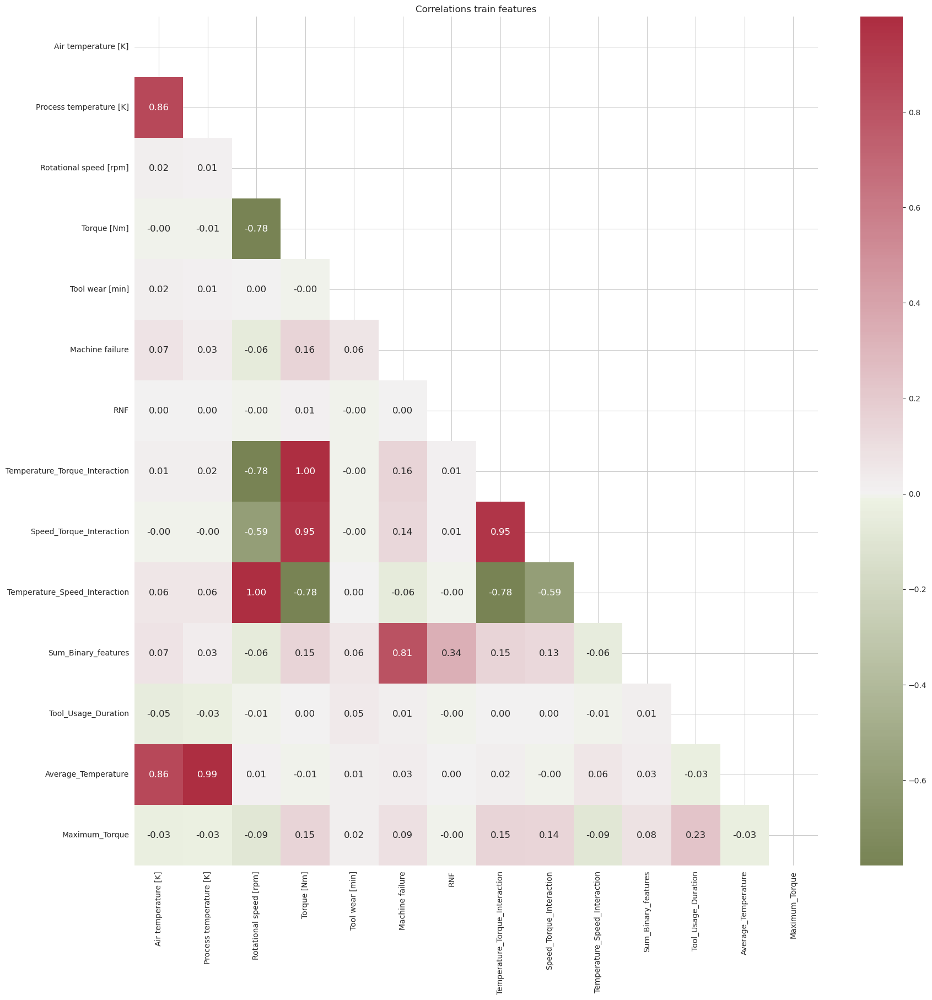

In [33]:
#plot_heatmap(train_eng[numeric_cols + news_cols + [target]], title='Train_eng data')

corr_mat_data = train_eng.corr()
data_mask = np.triu(np.ones_like(corr_mat_data, dtype = bool))
cmap = sns.diverging_palette(100, 7, s = 75, l = 40, n = 20, center = 'light', as_cmap = True)

#fig, axes = plt.subplots(1, 1, figsize = (25, 10))
plt.figure(figsize=(20, 20))
sns.heatmap(corr_mat_data, annot = True, cmap = cmap, fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations train features');

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Insight : <br>
        There is a strong correlation between the new feature I've added i.e "Sum_Binary_features" and the "Machine Failure". 
</b>
</p> 

In [34]:
X  = train_eng.drop(columns=['Machine failure'], axis=1)
y  = train_eng['Machine failure']
y.head(3)

0    0
1    0
2    0
Name: Machine failure, dtype: int64

In [35]:
X.head(3)

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],RNF,Temperature_Torque_Interaction,Speed_Torque_Interaction,Temperature_Speed_Interaction,Sum_Binary_features,Tool_Usage_Duration,Average_Temperature,Maximum_Torque
0,L50096,L,300.60000,309.60000,1596,36.10000,140,0,11176.56000,57615.60000,494121.60000,0,172,309.54800,50.20000
1,M20343,M,302.60000,312.10000,1759,29.10000,200,0,9082.11000,51186.90000,548983.90000,0,200,312.17000,54.60000
2,L49454,L,299.30000,308.50000,1805,26.50000,25,0,8175.25000,47832.50000,556842.50000,0,173,308.59697,54.30000


# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">CatBoost Model building</p>

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 CatBoostClassifier: <br><br>
        CatBoost is a supervised machine learning method that uses decision trees for classification. As its name suggests, CatBoost has two main features, it works with categorical data (the Cat) and it uses gradient boosting (the Boost). Gradient boosting is a process in which many decision trees are constructed iteratively. Each subsequent tree improves the result of the previous tree, leading to better results. <br>
CatBoost overcomes a limitation of other decision tree-based methods in which, typically, the data must be pre-processed to convert categorical string variables to numerical values, one-hot-encodings, and so on. This method can directly consume a combination of categorical and non-categorical explanatory variables without preprocessing. It preprocesses as part of the algorithm. 
        CatBoost uses ordered encoding to encode categorical features and also uses symmetric trees. <br>
CatBoost can also be faster than other methods such as XGBoost. It retains certain features—such as cross-validation, regularization, and missing value support—from the prior algorithms. This method performs well with both small data and large data.

</b>
</p> 

In [36]:
submission = pd.read_csv("/kaggle/input/playground-series-s3e17/sample_submission.csv")

## **SMOTE**

In [37]:
"""smote = SMOTE(random_state=42)
X_resampled[numeric_cols], y_resampled = smote.fit_resample(X[numeric_cols], y)"""

'smote = SMOTE(random_state=42)\nX_resampled[numeric_cols], y_resampled = smote.fit_resample(X[numeric_cols], y)'

In [38]:
"""# Check the class distribution before and after applying SMOTE
print("Before SMOTE:")
print(y.value_counts())


print("After SMOTE:")
print(y_resampled.value_counts())"""

'# Check the class distribution before and after applying SMOTE\nprint("Before SMOTE:")\nprint(y.value_counts())\n\n\nprint("After SMOTE:")\nprint(y_resampled.value_counts())'

## **Preparing the data for CatBoost**

In [39]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
features_names_list = X_train.columns.tolist()
features_names_list

train_pool    = Pool(X_train.to_numpy(), y_train.to_numpy(), feature_names = features_names_list, cat_features = ['Type', 'Product ID'])
val_pool      = Pool(X_val.to_numpy(), y_val.to_numpy(),     feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

test_pool     = Pool(test.to_numpy(),                        feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

X_pool        = Pool(X.to_numpy(), y.to_numpy(),             feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

## **Basic Approach**

In [40]:
model = CatBoostClassifier(learning_rate=0.1, iterations=500, random_seed=42)
model.fit(X_train, y_train,
          cat_features=[0, 1],
          eval_set=(X_val, y_val),
          verbose=False,
          plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [41]:
print("Train AUC :", roc_auc_score(y_val, model.predict_proba(X_val)[:,1]))

Train AUC : 0.9810763759588887


In [42]:
predictions = model.predict_proba(test_eng)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure':predictions}
).to_csv(
    'CatBoost_base_submission.csv', index=False
)

# **Improved approach**

In [43]:
params ={'loss_function': 'Logloss',
         'eval_metric': 'AUC',
         'random_seed': 42,
         'learning_rate': 0.027, 
          'iterations': 927, 
          'depth': 5, 
          'subsample': 0.705
        }

earlystop_params = params.copy()
earlystop_params.update({
    'od_type': 'Iter',
    'od_wait': 60
})

model2 = CatBoostClassifier(**earlystop_params)
model2.fit(train_pool, eval_set=val_pool, verbose=50, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.9297585	best: 0.9297585 (0)	total: 58.7ms	remaining: 54.4s
50:	test: 0.9607312	best: 0.9608583 (49)	total: 2.44s	remaining: 41.9s
100:	test: 0.9789214	best: 0.9789319 (97)	total: 4.82s	remaining: 39.5s
150:	test: 0.9813498	best: 0.9813498 (150)	total: 7.1s	remaining: 36.5s
200:	test: 0.9815244	best: 0.9815403 (163)	total: 9.51s	remaining: 34.3s
250:	test: 0.9815577	best: 0.9815985 (229)	total: 12.2s	remaining: 32.8s
Stopped by overfitting detector  (60 iterations wait)

bestTest = 0.9815984583
bestIteration = 229

Shrink model to first 230 iterations.


In [44]:
print("Train AUC :", roc_auc_score(y_val, model2.predict_proba(X_val)[:,1]))

Train AUC : 0.9815984583302302


In [45]:
feature_importances = model2.get_feature_importance(train_pool)
feature_names = X_train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    print('{}: {}'.format(name, score))

Sum_Binary_features: 42.9123194702695
Product ID: 11.172885249852
Rotational speed [rpm]: 7.598090256959959
Temperature_Speed_Interaction: 5.632089080066147
RNF: 5.18241323435547
Torque [Nm]: 4.8581415002923185
Tool wear [min]: 4.774063431747003
Speed_Torque_Interaction: 4.603237063077956
Temperature_Torque_Interaction: 3.830138819874582
Air temperature [K]: 3.143623999763418
Maximum_Torque: 2.3676594303686005
Tool_Usage_Duration: 2.1124184597225923
Process temperature [K]: 0.727782993516574
Average_Temperature: 0.6879337028963467
Type: 0.39720330723753317


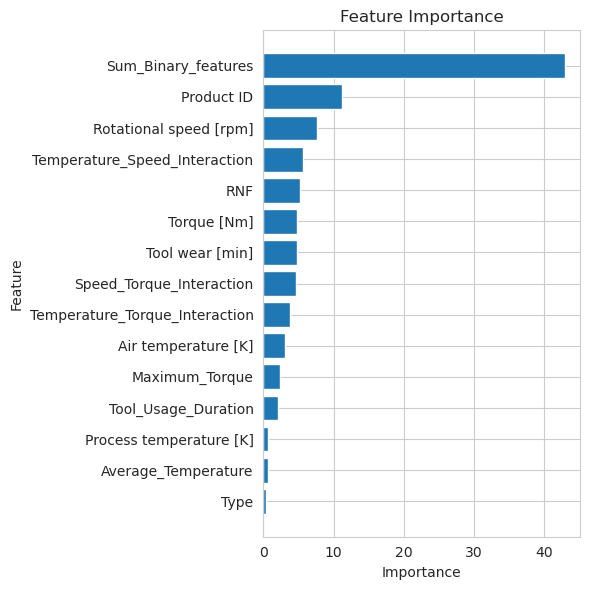

In [46]:
# Create a dataframe with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the dataframe by importance scores in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)  # Sort in ascending order

# Create a vertical bar plot of feature importance
plt.figure(figsize=(6, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

In [47]:
predictions2 = model2.predict_proba(test_pool)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure':predictions2}
).to_csv(
    'CatBoost_submission_base2.csv', index=False
)

# **Bagging**

In [48]:
predictions3 = []

for i in range(10):
    clf = CatBoostClassifier(**earlystop_params, logging_level='Silent')
    clf.fit(train_pool, eval_set=val_pool)
    predictions3.append(clf.predict_proba(test_pool)[:,1])
    
predictions3

[array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848])]

In [49]:
print("Train AUC :", roc_auc_score(y_val, clf.predict_proba(X_val)[:,1]))

Train AUC : 0.9815984583302302


In [50]:
prediction3 = np.mean(predictions3, axis=0)
pd.DataFrame(
    {'ID':test_id, 'Machine failure':prediction3}
).to_csv(
    'Bagging_CatBoost_submission.csv', index=False
)

# **Hyperparameters tuning**

In [51]:
# This function will calculate the quality of found hyperparameters on a test dataset:
def calculate_val_quality(train_pool=train_pool, val_pool=val_pool, **kwargs):
    model = CatBoostClassifier(**kwargs, random_seed=42)
    model.fit(train_pool, verbose=100, eval_set=val_pool)
    y_pred = model.predict_proba(val_pool)
    return eval_metric(val_pool.get_label(), y_pred[:, 1], 'AUC')

In [52]:
# Let's train a model with default parameters:
calculate_val_quality()

Learning rate set to 0.101056
0:	learn: 0.4447192	test: 0.4449461	best: 0.4449461 (0)	total: 62.5ms	remaining: 1m 2s
100:	learn: 0.0169450	test: 0.0186006	best: 0.0185689 (92)	total: 5.92s	remaining: 52.7s
200:	learn: 0.0153991	test: 0.0185921	best: 0.0185233 (116)	total: 11.5s	remaining: 45.7s
300:	learn: 0.0141679	test: 0.0188117	best: 0.0185233 (116)	total: 17.1s	remaining: 39.8s
400:	learn: 0.0130285	test: 0.0190360	best: 0.0185233 (116)	total: 22.8s	remaining: 34s
500:	learn: 0.0120744	test: 0.0193068	best: 0.0185233 (116)	total: 28.5s	remaining: 28.4s
600:	learn: 0.0112974	test: 0.0194520	best: 0.0185233 (116)	total: 34.1s	remaining: 22.7s
700:	learn: 0.0106044	test: 0.0196363	best: 0.0185233 (116)	total: 40.1s	remaining: 17.1s
800:	learn: 0.0100472	test: 0.0197545	best: 0.0185233 (116)	total: 45.8s	remaining: 11.4s
900:	learn: 0.0094319	test: 0.0200008	best: 0.0185233 (116)	total: 51.6s	remaining: 5.67s
999:	learn: 0.0088561	test: 0.0202218	best: 0.0185233 (116)	total: 57.5s	rem

[0.9795241677217547]

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 GridSearchCV & RandomSearchCV : <br>
    </b>
</p>

First, I've optimized the following hyperparameters using numeric features only:
- **learning_rate** - used for reducing the gradient step
- **depth** - depth of the tree
- **l2_leaf_reg** - coefficient at the L2 regularization term of the cost function
- **boosting_type** - boosting scheme. Possible values: Ordered, Plain

There are 2 built-in methods of hyperparameters tuning in CatBoost: grid search and random search. Grid search is simply an exhaustive searching through a manually specified subset of the hyperparameter space. 

**But for better results I'll use Bayesian Optimization method like Optuna Optimization**

<p style="padding:15px; background-color:#000000; font-weight:bold; color:#FCFF00; font-size:100%; border-radius: 15px 15px;">
    <b>💡 Bayesian optimization : <br>
    </b>
</p>

Random and grid search pay no attention to past results when searhing the best hyperparametes. Bayesian optimization, in contrast to random or grid search, keeps track of past evaluation results which it uses to form a probabilistic model mapping hyperparameters to a probability of a score on the objective function. There're a number of libraries that can do it like:  [optuna](https://github.com/optuna/optuna) and [hyperopt](https://github.com/hyperopt/hyperopt) but **I'll focus on Optuna.**

We will also optimize **max_ctr_complexity** parameter - the maximum number of features that can be combined. Each resulting combination consists of one or more categorical features and can optionally contain binary features in the following form: “numeric feature > value”.

# Stratified K-Fold

In [53]:
"""cat_cv_scores  = list()

def objective(trial):
    params = {
        'eval_metric': 'AUC',
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
        'depth': trial.suggest_int('depth', 3, 15),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'boosting_type': 'Ordered',
        'max_ctr_complexity': trial.suggest_int('max_ctr_complexity', 0, 8),
        'iterations': trial.suggest_int('iterations', 300, 1000),
        'subsample': trial.suggest_float('subsample', 0.1, 0.9)
    }
    
    earlystop_params = params.copy()
    earlystop_params.update({
        'od_type': 'Iter',
        'od_wait': 60
    })
    
    skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
    
    for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):
        
        print("=======================================================================")
        
        X_traino, X_testo = X_train.iloc[train_ix], X_train.iloc[test_ix]
        y_traino, y_testo = y_train.iloc[train_ix], y_train.iloc[test_ix]
        
        traino_pool    = Pool(X_traino.to_numpy(), y_traino.to_numpy(), feature_names = features_names_list, cat_features = ['Type', 'Product ID'])
        testo_pool      = Pool(X_testo.to_numpy(), y_testo.to_numpy(),     feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

        optuna_model = CatBoostClassifier(**earlystop_params, random_seed=42)
        optuna_model.fit(traino_pool, verbose=0, eval_set=testo_pool)
        
        y_pred = optuna_model.predict_proba(testo_pool)
        cat_score_fold = eval_metric(testo_pool.get_label(), y_pred[:, 1], 'AUC')   
        cat_cv_scores.append(cat_score_fold)

        print('Fold N°', i, '==> CatBoost       - AUC: ====>', cat_score_fold)
    
    return np.mean(cat_cv_scores)

sampler = TPESampler(seed=123)
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=15)"""

'cat_cv_scores  = list()\n\ndef objective(trial):\n    params = {\n        \'eval_metric\': \'AUC\',\n        \'learning_rate\': trial.suggest_float(\'learning_rate\', 0.001, 0.3),\n        \'depth\': trial.suggest_int(\'depth\', 3, 15),\n        \'l2_leaf_reg\': trial.suggest_float(\'l2_leaf_reg\', 1, 10),\n        \'boosting_type\': \'Ordered\',\n        \'max_ctr_complexity\': trial.suggest_int(\'max_ctr_complexity\', 0, 8),\n        \'iterations\': trial.suggest_int(\'iterations\', 300, 1000),\n        \'subsample\': trial.suggest_float(\'subsample\', 0.1, 0.9)\n    }\n    \n    earlystop_params = params.copy()\n    earlystop_params.update({\n        \'od_type\': \'Iter\',\n        \'od_wait\': 60\n    })\n    \n    skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)\n    \n    for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):\n        \n        print("=======================================================================")\n        \n        X_tra

In [54]:
# Best params obtained from Optuna

best_params = {'learning_rate': 0.15993386077870966,
                 'depth': 9,
                 'l2_leaf_reg': 6.70960862696189,
                 'max_ctr_complexity': 7,
                 'iterations': 807,
                 'subsample': 0.5888188085420664}

calculate_val_quality(**best_params)
best_params

0:	learn: 0.3338208	test: 0.3341413	best: 0.3341413 (0)	total: 95.5ms	remaining: 1m 17s
100:	learn: 0.0143354	test: 0.0187829	best: 0.0185913 (77)	total: 9.17s	remaining: 1m 4s
200:	learn: 0.0115933	test: 0.0192070	best: 0.0185913 (77)	total: 18.4s	remaining: 55.4s
300:	learn: 0.0096969	test: 0.0196317	best: 0.0185913 (77)	total: 27.7s	remaining: 46.6s
400:	learn: 0.0084545	test: 0.0198202	best: 0.0185913 (77)	total: 37s	remaining: 37.4s
500:	learn: 0.0073305	test: 0.0203236	best: 0.0185913 (77)	total: 46.5s	remaining: 28.4s
600:	learn: 0.0064490	test: 0.0206554	best: 0.0185913 (77)	total: 55.8s	remaining: 19.1s
700:	learn: 0.0056526	test: 0.0210311	best: 0.0185913 (77)	total: 1m 5s	remaining: 9.87s
800:	learn: 0.0050716	test: 0.0214901	best: 0.0185913 (77)	total: 1m 14s	remaining: 560ms
806:	learn: 0.0050446	test: 0.0215074	best: 0.0185913 (77)	total: 1m 15s	remaining: 0us

bestTest = 0.01859126257
bestIteration = 77

Shrink model to first 78 iterations.


{'learning_rate': 0.15993386077870966,
 'depth': 9,
 'l2_leaf_reg': 6.70960862696189,
 'max_ctr_complexity': 7,
 'iterations': 807,
 'subsample': 0.5888188085420664}

In [55]:
best_cat_cv_scores, best_cat_preds = list(), list()
skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
    
for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):

    X_traino, X_testo = X_train.iloc[train_ix], X_train.iloc[test_ix]
    y_traino, y_testo = y_train.iloc[train_ix], y_train.iloc[test_ix]

    traino_pool     = Pool(X_traino.to_numpy(), y_traino.to_numpy(), feature_names = features_names_list, cat_features = ['Type', 'Product ID'])
    testo_pool      = Pool(X_testo.to_numpy(), y_testo.to_numpy(),     feature_names = features_names_list, cat_features = ['Type', 'Product ID'])


    best_optuna_model = CatBoostClassifier(**best_params, random_seed=42)
    best_optuna_model.fit(traino_pool, verbose=0, eval_set=testo_pool)

    y_pred = best_optuna_model.predict_proba(testo_pool)
    cat_score_fold = eval_metric(testo_pool.get_label(), y_pred[:, 1], 'AUC')   
    best_cat_cv_scores.append(cat_score_fold)

    print('Fold N°', i, '==> CatBoost       -Best AUC: ====>', cat_score_fold)

print("Best score: =====>", np.mean(best_cat_cv_scores))

Fold N° 0 ==> CatBoost       -Best AUC: ====> [0.9839095623393453]
Fold N° 1 ==> CatBoost       -Best AUC: ====> [0.9815481160364279]
Fold N° 2 ==> CatBoost       -Best AUC: ====> [0.9700551278617897]
Fold N° 3 ==> CatBoost       -Best AUC: ====> [0.977962596318806]
Fold N° 4 ==> CatBoost       -Best AUC: ====> [0.983000558646446]
Best score: =====> 0.9792951922405629


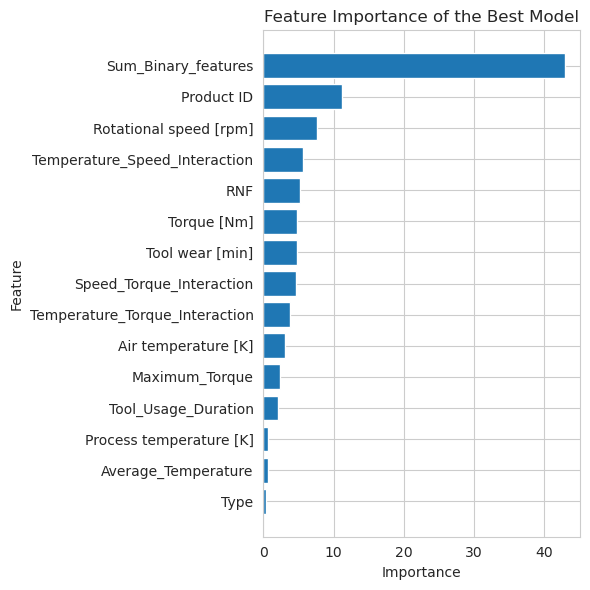

In [56]:
best_feature_importances = best_optuna_model.get_feature_importance(train_pool)
feature_names = X_train.columns
# Create a dataframe with feature names and their importance scores
best_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': best_feature_importances})

# Sort the dataframe by importance scores in descending order
best_feature_importance_df = best_feature_importance_df.sort_values(by='Importance', ascending=True)  # Sort in ascending order

# Create a vertical bar plot of feature importance
plt.figure(figsize=(6, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance of the Best Model')
plt.tight_layout()
plt.show()

Area under ROC curve: 0.9783905191032993


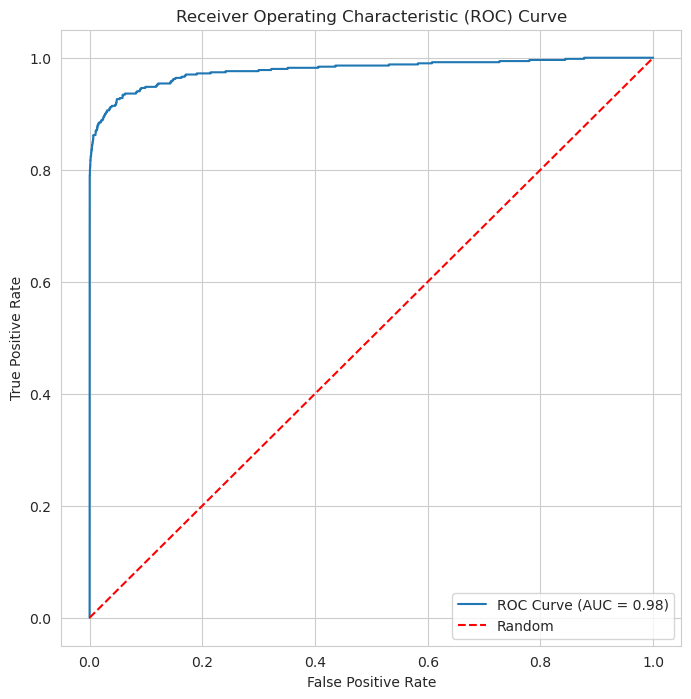

In [57]:
y_prob = best_optuna_model.predict_proba(X_val)[:, 1]
# Calculate the area under the ROC curve
roc_auc = roc_auc_score(y_val, y_prob)
print("Area under ROC curve:", roc_auc)

# Compute the false positive rate and true positive rate
fpr, tpr, thresholds = roc_curve(y_val, y_prob)

# Plot the ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">Final Submission</p>  

In [58]:
best_optuna_predictions = best_optuna_model.predict_proba(test_eng)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure': best_optuna_predictions}
).to_csv(
    'Best_Optuna_CatBoost_submission.csv', index=False
)

# <p style="padding:15px; background-color:#FFFF00; font-family:JetBrains Mono; font-weight:bold; color:#000000; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 15px 15px; border: 5px solid #000000">Ressources</p>  

For more details about univariate and bivariate statistics, check [this article](https://www.analyticsvidhya.com/blog/2021/04/exploratory-analysis-using-univariate-bivariate-and-multivariate-analysis-techniques/)

The functions of some graphics used above are inspired from this great [notebook](https://www.kaggle.com/code/tetsutani/ps3e17-eda-ensemble-ml-pipeline-shap)